# Explore fitness-AQA (action quality assessment) dataset

- test initial loading and visualization

Squat Dataset general characteristics:
- presence of error labels in approx 1623 videos in "labeled" directory
    - about 700 with 480x480 image size
        - about 200 of these are labeled with NaN => correct movement w/o error
    - about 100-400 total frames at 30 fps = 3-10 second video length
    - barbell_trajectory values range from 100-400ish - likely y-coordinates
- approx 4900 barbell trajectories in "unlabeled" directory, which encompasses videos with labels

# load preliminaries, checkpoints

In [3]:
import os, sys, glob
import pickle as pkl
from pathlib import Path
import yaml, json
import importlib
import fnmatch
import shutil
import imageio
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import regularizers

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

import cv2 as cv


In [4]:
%cd ..
ROOT_DIR = os.getcwd()

c:\MLprojects\human_motion_analysis


In [5]:
from src.io import iomod
from src.tests import structshape

# load

In [4]:
# load jsons
errorlabels_inward = json.load(open(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Labeled_Dataset/Labels/error_knees_inward.json")))
errorlabels_forward = json.load(open(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Labeled_Dataset/Labels/error_knees_forward.json")))
barbell_trajectory = json.load(open(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Labeled_Dataset/Labels/error_knees_forward.json")))

# get video and barbell_trajectory paths
video_paths_labeled = list(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Labeled_Dataset/videos").rglob("*.mp4"))
video_paths_unlabeled = list(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_002/Squat/Unlabeled_Dataset/videos").rglob("*.mp4"))
barbell_trajectory_paths = list(Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Unlabeled_Dataset/bar_trajectories_raw").rglob("*.json"))

print(f"len(video_paths_labeled):\t\t{len(video_paths_labeled)}")
print(f"len(video_paths_unlabeled):\t\t{len(video_paths_unlabeled)}")
print(f"len(errorlabels_inward.keys()):\t\t{len(errorlabels_inward.keys())}")
print(f"len(errorlabels_forward.keys()):\t{len(errorlabels_forward.keys())}")
print(f"len(barbell_trajectory_paths):\t\t{len(barbell_trajectory_paths)}")


len(video_paths_labeled):		1739
len(video_paths_unlabeled):		4970
len(errorlabels_inward.keys()):		1623
len(errorlabels_forward.keys()):	1623
len(barbell_trajectory_paths):		4970


In [5]:
# load into dictionary for downstream use
barbell_trajectory_dict = {}
for path in barbell_trajectory_paths:
    barbell_trajectory_dict[path.stem] = json.load(open(path))

In [6]:
list(barbell_trajectory_dict.keys())[:5]

['25195_3', '25706_5', '25707_3', '25708_2', '25709_1']

# explore "labeled" directory videos and labels of squat error

## filter paths based on existing label names

In [ ]:
# filter on existing label names by comparing with json names and removing nones (faster than filter(lambda x) approach)
df_labeled = pd.DataFrame(video_paths_labeled, columns=["path"])
df_labeled["name"] = df_labeled["path"].apply(lambda x: x.stem if x.stem in errorlabels_inward.keys() else None)
df_labeled = df_labeled[df_labeled["name"].notnull()].reset_index(drop=True)

# match based on stem name as keys to json
df_labeled["errorlabels_inward"] = df_labeled["name"].apply(lambda x: errorlabels_inward[x])
df_labeled["errorlabels_forward"] = df_labeled["name"].apply(lambda x: errorlabels_forward[x])

# unnest and remove nested value columns
df_labeled["errorlabels_inward_start"] = df_labeled["errorlabels_inward"].apply(lambda x: x[0][0] if x else None)
df_labeled["errorlabels_inward_end"] = df_labeled["errorlabels_inward"].apply(lambda x: x[0][1] if x else None)
df_labeled["errorlabels_forward_start"] = df_labeled["errorlabels_forward"].apply(lambda x: x[0][0] if x else None)
df_labeled["errorlabels_forward_end"] = df_labeled["errorlabels_forward"].apply(lambda x: x[0][1] if x else None)
df_labeled = df_labeled.drop(columns=["errorlabels_inward", "errorlabels_forward"])

# barbell trajectories, filter on existing json files
df_labeled["barbell_trajectory"] = df_labeled["name"].apply(lambda x: barbell_trajectory_dict[x] if x in barbell_trajectory_dict.keys() else None)
df_labeled = df_labeled[df_labeled["barbell_trajectory"].notnull()].reset_index(drop=True)

# set "name" as index
df_labeled = df_labeled.set_index("name")

df_labeled

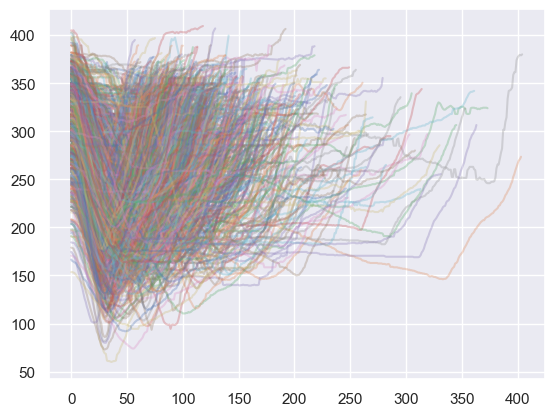

In [8]:
# plot all
for i in range(len(df_labeled)):
	try:
		plt.plot(df_labeled.barbell_trajectory[i], alpha=0.3)

	except:
		print(df_labeled.name[i])

In [9]:
df_labeled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1517 entries, 32903_8 to 50818_5
Data columns (total 6 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   path                       1517 non-null   object 
 1   errorlabels_inward_start   217 non-null    float64
 2   errorlabels_inward_end     217 non-null    float64
 3   errorlabels_forward_start  1035 non-null   float64
 4   errorlabels_forward_end    1035 non-null   float64
 5   barbell_trajectory         1517 non-null   object 
dtypes: float64(4), object(2)
memory usage: 83.0+ KB


In [12]:
df_labeled.describe()

,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end
count,217.000000,217.000000,1035.000000,1035.000000
mean,2.205760,3.552719,1.679816,3.296058
std,1.028512,1.300929,1.168848,1.433937
min,1.040000,1.440000,0.240000,1.110000
25%,1.560000,2.640000,0.790000,2.270000
50%,1.880000,3.320000,1.260000,3.040000
75%,2.620000,4.080000,2.300000,3.880000
max,9.620000,10.470000,10.080000,12.080000


## visualize and match to specific videos to validate label ratings

In [13]:
from IPython.display import HTML, display
from base64 import b64encode

def show_video(video_path: Path) -> None:
    video = open(video_path, "rb").read()
    video_url = f"data:video/mp4;base64,{b64encode(video).decode()}"# + b64encode(video).decode()
    display(
		HTML(
			"""<video width=400 controls>
			<source src="%s" type="video/mp4">
			</video>""" % video_url
		)
    )

video_dir = Path("data/Fitness-AQA/Fitness-AQA_dataset_release_001/Squat/Labeled_Dataset/videos")

### unlabeled = no error

In [14]:
df_labeled

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory
name,,,,,,
37250_4,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[245.0, 245.0, 244.0, 241.5, 237.5, 233.5, 229..."
47054_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,2.19,3.53,1.14,4.41,"[307.0, 307.0, 306.5, 306.0, 303.0, 300.0, 296..."
49437_3,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[285.5, 285.0, 284.5, 282.5, 275.5, 265.5, 250..."
48141_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.32,5.40,"[229.5, 228.5, 228.5, 228.5, 228.0, 227.0, 223..."
48104_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,3.27,4.32,2.70,4.90,"[258.0, 254.5, 255.0, 254.5, 254.5, 254.0, 254..."
...,...,...,...,...,...,...
50264_2,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,2.63,3.57,"[343.0, 335.0, 335.5, 335.0, 334.5, 331.5, 329..."
36243_3,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,0.75,2.02,"[299.0, 298.5, 297.5, 296.0, 294.5, 292.0, 290..."
47145_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,1.96,3.37,2.38,3.88,"[303.5, 303.0, 302.0, 300.0, 294.0, 291.0, 286..."


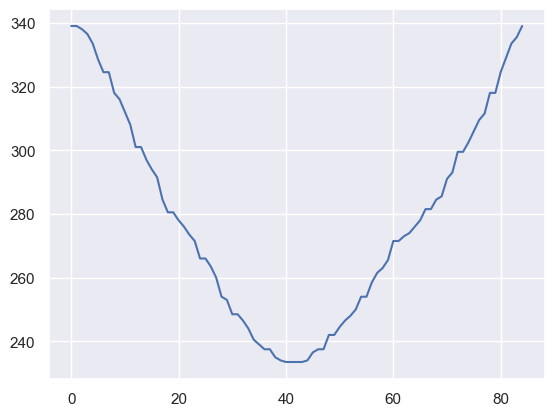

In [15]:
name = "32903_8"
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])

### inward knee error

In [16]:
df_labeled[df_labeled.errorlabels_inward_start > 7]

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory
name,,,,,,
48121_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,9.62,10.47,NaN,NaN,"[319.0, 322.5, 322.5, 322.5, 323.0, 322.5, 322..."


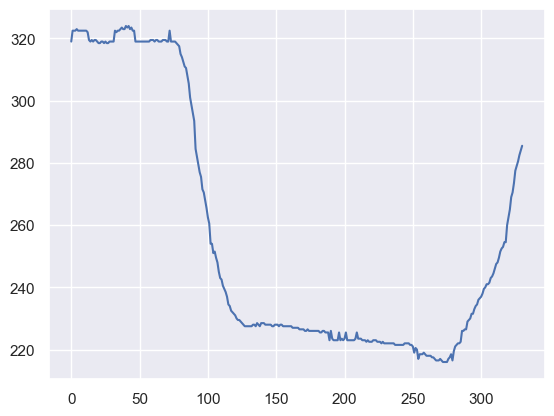

In [17]:
name = "48121_1" # error_inward 9.62	10.47
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])


### forward knee error

In [18]:
df_labeled[df_labeled.errorlabels_forward_start > 7] # later

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory
name,,,,,,
49338_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,7.67,8.32,"[368.0, 368.0, 368.0, 367.0, 366.5, 366.0, 366..."
48859_3,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,10.08,11.23,"[306.0, 303.0, 302.5, 302.0, 301.5, 300.5, 299..."
46984_2,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,7.07,11.23,"[350.0, 349.5, 349.0, 349.0, 348.5, 347.5, 347..."


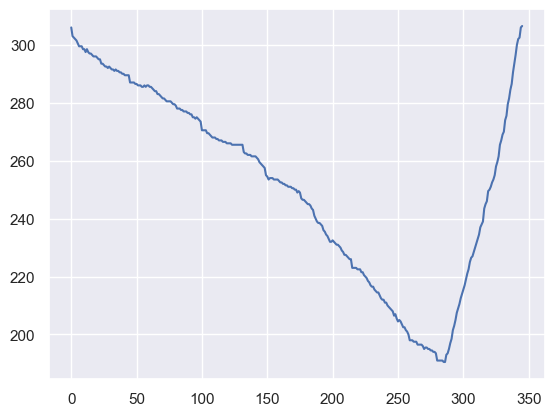

In [19]:
name = "48859_3" # error_forward 10
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])

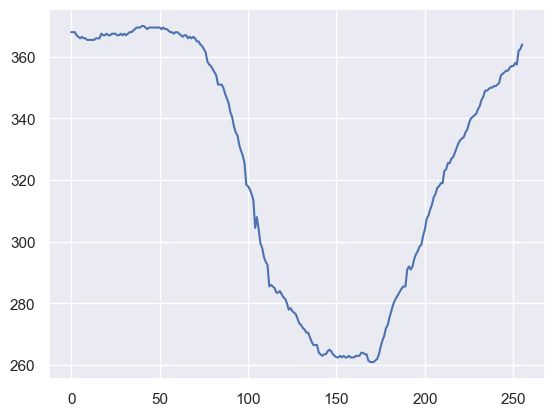

In [20]:
name = "49338_1" # error_forward 7.67	8.32
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])


In [21]:
df_labeled[df_labeled.errorlabels_forward_start > 3] # earlier

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory
name,,,,,,
48141_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.32,5.40,"[229.5, 228.5, 228.5, 228.5, 228.0, 227.0, 223..."
49569_5,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.54,5.19,"[339.5, 339.5, 334.5, 334.0, 333.0, 332.5, 331..."
46316_6,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.21,4.45,"[293.0, 292.5, 292.0, 291.0, 290.0, 286.5, 286..."
33146_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.74,4.43,"[347.0, 346.0, 345.5, 343.0, 341.5, 340.5, 339..."
38040_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,4.55,6.46,4.00,6.61,"[271.0, 270.5, 270.5, 270.0, 270.0, 269.0, 268..."
...,...,...,...,...,...,...
47305_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,4.28,5.47,"[329.5, 329.0, 328.5, 328.5, 317.0, 316.5, 316..."
50215_21,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,3.28,4.21,"[319.0, 318.5, 318.5, 318.0, 317.5, 314.5, 312..."
46655_1,data/Fitness-AQA/Fitness-AQA_dataset_release_0...,NaN,NaN,5.56,6.31,"[318.0, 317.5, 317.0, 316.5, 316.5, 316.5, 316..."


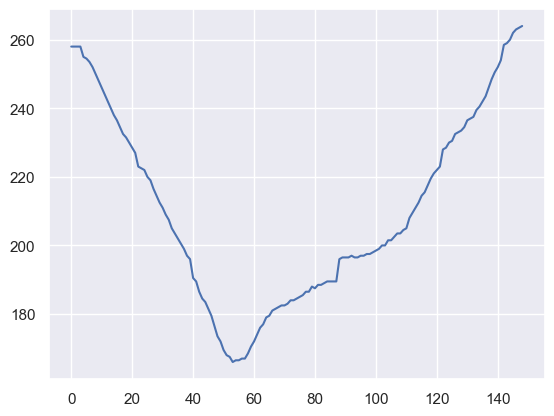

In [22]:
name = "32907_3" # error inward 2.24	4.16  error_forward	3.07	4.67
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])


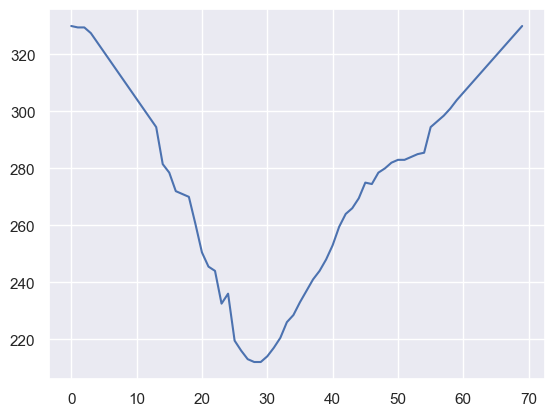

In [23]:
# inward 1.20	1.81	| forward 0.43	1.57
name = "48642_10"
video_path = video_dir.joinpath(f"{name}.mp4")
show_video(video_path)
plt.plot(df_labeled.loc[name, "barbell_trajectory"])


# check dataset characteristics

In [10]:
df_labeled

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory
name,,,,,,
32903_8,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[339.0, 339.0, 338.0, 336.5, 333.5, 328.5, 324..."
32907_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,2.24,4.16,3.07,4.67,"[258.0, 258.0, 258.0, 258.0, 255.0, 254.5, 253..."
32939_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[340.5, 340.5, 339.5, 338.5, 335.5, 333.5, 330..."
32964_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,1.15,2.51,"[389.5, 389.0, 389.0, 388.5, 388.0, 381.0, 381..."
32971_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,0.62,2.56,"[295.5, 293.5, 291.5, 291.0, 285.5, 283.5, 279..."
...,...,...,...,...,...,...
50805_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,2.50,5.67,"[325.0, 325.0, 324.5, 323.5, 318.5, 318.0, 316..."
50807_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[347.0, 347.0, 346.5, 345.5, 344.0, 341.0, 337..."
50813_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[293.0, 291.5, 291.0, 290.0, 286.5, 285.5, 284..."


In [25]:
# # check input lengths, load each video and check dimensions for labeled
# for i in range(len(df_labeled)):
#     try:
#         video_path = df_labeled.path[i]
#         video = cv.VideoCapture(str(video_path))
#         fps = video.get(cv.CAP_PROP_FPS)
#         frame_count = int(video.get(cv.CAP_PROP_FRAME_COUNT))
#         duration = frame_count/fps
#         image_width = int(video.get(cv.CAP_PROP_FRAME_WIDTH))
#         image_height = int(video.get(cv.CAP_PROP_FRAME_HEIGHT))
#         print(f"{video_path.stem} {duration:.2f} {frame_count} {fps:.2f} {image_width}x{image_height}")
#         # load into new column
#         df_labeled.loc[video_path.stem, "duration"] = duration
#         df_labeled.loc[video_path.stem, "frame_count"] = frame_count
#         df_labeled.loc[video_path.stem, "fps"] = fps
#         df_labeled.loc[video_path.stem, "image_width"] = image_width
#         df_labeled.loc[video_path.stem, "image_height"] = image_height

#     except:
#         print(f"{i}")

In [26]:
# # filter for 480x480
# idx = df_labeled[(df_labeled.image_width == 480) & (df_labeled.image_height == 480)].index
# df_labeled = df_labeled.loc[idx].reset_index(drop=False).set_index("name")
# df_labeled


In [27]:
# calculate number of videos with errorlabels all NaN => correct movement:
# df_labeled[df_labeled.errorlabels_inward_start.isnull() & df_labeled.errorlabels_inward_end.isnull() & df_labeled.errorlabels_forward_start.isnull() & df_labeled.errorlabels_forward_end.isnull()].shape[0]

# make self-supervised training set (using unlabeled)

- normalize to barbell trajectory to [0, 1]
- associate each value w/ each frame
- randomly select anchors and corresponding positive and negative based on threshold (e.g. 0.1) 

In [11]:
# filter on existing label names by comparing with json names and removing nones (faster than filter(lambda x) approach)
df_unlabeled = pd.DataFrame(video_paths_unlabeled, columns=["path"])
df_unlabeled["name"] = df_unlabeled["path"].apply(lambda x: x.stem if x.stem in barbell_trajectory_dict.keys() else None)
df_unlabeled["barbell_trajectory"] = df_unlabeled["name"].apply(lambda x: barbell_trajectory_dict[x] if x in barbell_trajectory_dict.keys() else None)
df_unlabeled = df_unlabeled.set_index("name")
df_unlabeled

,path,barbell_trajectory
name,,
25195_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[302.0, 300.0, 299.0, 298.0, 295.0, 292.5, 291..."
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334..."
25707_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[391.5, 385.25, 379.0, 378.5, 374.0, 360.5, 35..."
25708_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[308.5, 307.5, 305.5, 304.5, 303.5, 300.0, 298..."
25709_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[342.5, 342.0, 339.5, 339.0, 334.5, 333.0, 311..."
...,...,...
50809_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[342.5, 342.0, 342.0, 341.0, 337.5, 334.0, 333..."
50812_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[311.0, 310.5, 310.0, 308.0, 306.0, 304.0, 302..."
50813_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[293.0, 291.5, 291.0, 290.0, 286.5, 285.5, 284..."


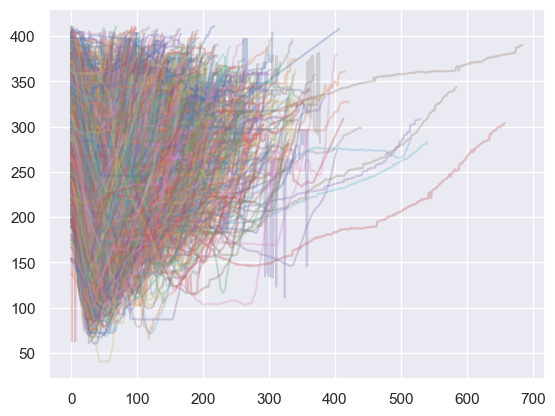

In [12]:
# plot all
for i in range(len(df_unlabeled)):
	try:
		plt.plot(df_unlabeled.barbell_trajectory[i], alpha=0.3)

	except:
		print(df_unlabeled.name[i])

In [13]:
# check input lengths, load each video and check dimensions for unlabeled (30s runtime)
for i in range(len(df_unlabeled)):
    try:
        video_path = df_unlabeled.path[i]
        video = cv.VideoCapture(str(video_path))
        fps = video.get(cv.CAP_PROP_FPS)
        frame_count = int(video.get(cv.CAP_PROP_FRAME_COUNT))
        duration = frame_count/fps
        image_width = int(video.get(cv.CAP_PROP_FRAME_WIDTH))
        image_height = int(video.get(cv.CAP_PROP_FRAME_HEIGHT))
        print(f"{video_path.stem} {duration:.2f} {frame_count} {fps:.2f} {image_width}x{image_height}")
        # load into new column
        df_unlabeled.loc[video_path.stem, "duration"] = duration
        df_unlabeled.loc[video_path.stem, "frame_count"] = frame_count
        df_unlabeled.loc[video_path.stem, "fps"] = fps
        df_unlabeled.loc[video_path.stem, "image_width"] = image_width
        df_unlabeled.loc[video_path.stem, "image_height"] = image_height

    except:
        print(f"{i}")

25195_3 2.97 89 30.00 480x600
25706_5 5.33 160 30.00 480x480
25707_3 4.90 147 30.00 480x600
25708_2 2.47 74 30.00 480x480
25709_1 3.53 106 30.00 480x480
25710_4 2.40 72 30.00 480x480
25711_2 2.43 73 30.00 480x480
25712_4 5.77 173 30.00 480x480
25713_3 4.00 120 30.00 480x600
25714_1 6.00 180 30.00 480x480
25715_3 2.67 80 30.00 480x600
25716_2 1.93 58 30.00 480x480
25717_2 4.30 129 30.00 480x600
25718_1 4.63 139 30.00 480x480
25719_2 2.67 80 30.00 480x480
25721_1 9.53 286 30.00 480x480
25722_3 3.07 92 30.00 480x600
25723_2 3.73 112 30.00 480x480
25724_1 6.60 198 30.00 480x480
25725_5 5.10 153 30.00 480x480
25726_2 5.53 166 30.00 480x600
25727_1 4.07 122 30.00 480x480
25728_1 1.60 48 30.00 480x480
25731_2 2.60 78 30.00 480x600
25732_1 3.00 90 30.00 480x480
25733_1 6.80 204 30.00 480x480
25734_3 2.73 82 30.00 480x600
25735_1 3.83 115 30.00 480x600
25736_8 3.00 90 30.00 480x600
25737_1 3.17 95 30.00 480x600
25738_3 7.43 223 30.00 480x480
25739_1 2.43 73 30.00 480x270
25741_1 2.43 73 30.00 4

In [14]:
# filter for 480x480
idx = df_unlabeled[(df_unlabeled.image_width == 480) & (df_unlabeled.image_height == 480)].index
df_unlabeled = df_unlabeled.loc[idx].reset_index(drop=False).set_index("name")
df_unlabeled

,path,barbell_trajectory,duration,frame_count,fps,image_width,image_height
name,,,,,,,
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0
25708_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[308.5, 307.5, 305.5, 304.5, 303.5, 300.0, 298...",2.466667,74.0,30.0,480.0,480.0
25709_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[342.5, 342.0, 339.5, 339.0, 334.5, 333.0, 311...",3.533333,106.0,30.0,480.0,480.0
25710_4,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[373.5, 373.5, 373.0, 364.0, 364.0, 363.0, 360...",2.400000,72.0,30.0,480.0,480.0
25711_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[284.5, 283.0, 283.0, 278.5, 271.5, 262.0, 252...",2.433333,73.0,30.0,480.0,480.0
...,...,...,...,...,...,...,...
50795_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[296.0, 294.5, 293.5, 293.0, 291.0, 285.5, 284...",6.133333,184.0,30.0,480.0,480.0
50801_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[364.5, 363.5, 363.5, 363.5, 363.5, 359.5, 359...",3.733333,112.0,30.0,480.0,480.0
50803_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[333.0, 333.0, 332.5, 333.0, 333.0, 332.5, 332...",8.266667,248.0,30.0,480.0,480.0


In [15]:
import itertools
from sklearn.preprocessing import MinMaxScaler
from typing import Tuple

def normalize_barbell_trajectory(barbell_trajectory):
	barbell_trajectory = np.array(barbell_trajectory)
	traj_norm = MinMaxScaler().fit_transform(barbell_trajectory.reshape(-1, 1)).flatten()
	return traj_norm

def create_triplets(df, anchor_idx: Tuple[int, int], num_examples=10, threshold=0.1):
	"""sample from all video frames based on anchor,
	get positive and negative example indices using similarity threshold given normalized trajectory"""
	anchor = df.loc[anchor_idx, "traj_norm"]
	# boolean mask of values close to vs far away from anchor
	mask_pos = (df['traj_norm'] < (anchor + threshold)) & (df['traj_norm'] > (anchor - threshold))
	mask_neg = ~(mask_pos)
	df_subset_pos = df.loc[mask_pos, :]
	df_subset_neg = df.loc[mask_neg, :]
	pos = np.random.choice(df_subset_pos.index, num_examples)
	neg = np.random.choice(df_subset_neg.index, num_examples)
	return list(zip(itertools.repeat(anchor_idx, num_examples), pos, neg))

In [16]:
df_unlabeled["fri"] = df_unlabeled["barbell_trajectory"].apply(lambda x: list(range(len(x))))

In [17]:
df_unlabeled

,path,barbell_trajectory,duration,frame_count,fps,image_width,image_height,fri
name,,,,,,,,
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
25708_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[308.5, 307.5, 305.5, 304.5, 303.5, 300.0, 298...",2.466667,74.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
25709_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[342.5, 342.0, 339.5, 339.0, 334.5, 333.0, 311...",3.533333,106.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
25710_4,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[373.5, 373.5, 373.0, 364.0, 364.0, 363.0, 360...",2.400000,72.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
25711_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[284.5, 283.0, 283.0, 278.5, 271.5, 262.0, 252...",2.433333,73.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...,...,...,...,...,...
50795_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[296.0, 294.5, 293.5, 293.0, 291.0, 285.5, 284...",6.133333,184.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
50801_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[364.5, 363.5, 363.5, 363.5, 363.5, 359.5, 359...",3.733333,112.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
50803_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[333.0, 333.0, 332.5, 333.0, 333.0, 332.5, 332...",8.266667,248.0,30.0,480.0,480.0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


In [18]:
# explode list and create new column for the list item index
df_unlabeled['traj_norm'] = df_unlabeled.barbell_trajectory.apply(normalize_barbell_trajectory)
df_unlabeled_exploded = df_unlabeled.explode(['traj_norm', 'fri'])


In [19]:
df_unlabeled_exploded

,path,barbell_trajectory,duration,frame_count,fps,image_width,image_height,fri,traj_norm
name,,,,,,,,,
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,0,0.978659
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,1,0.978659
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,2,0.972561
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,3,0.966463
25706_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[338.5, 338.5, 337.5, 336.5, 335.5, 334.0, 334...",5.333333,160.0,30.0,480.0,480.0,4,0.960366
...,...,...,...,...,...,...,...,...,...
50818_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[301.5, 300.0, 299.5, 298.0, 297.5, 297.5, 298...",3.133333,94.0,30.0,480.0,480.0,89,0.915556
50818_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[301.5, 300.0, 299.5, 298.0, 297.5, 297.5, 298...",3.133333,94.0,30.0,480.0,480.0,90,0.942222
50818_5,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,"[301.5, 300.0, 299.5, 298.0, 297.5, 297.5, 298...",3.133333,94.0,30.0,480.0,480.0,91,0.955556


# filter null and drop original barbell_trajectory positions
df_unlabeled_exploded = df_unlabeled_exploded[df_unlabeled_exploded.traj_norm.notnull()].drop(columns=["barbell_trajectory"])
df_unlabeled_exploded

In [21]:
df_unlabeled_exploded = df_unlabeled_exploded.reset_index(drop=False).set_index(["name", "fri"])
df_unlabeled_exploded

path  duration  \
name    fri                                                                
25706_5 0    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        1    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        2    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        3    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        4    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
...                                                        ...       ...   
50818_5 89   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        90   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        91   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        92   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        93   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   

             frame_count   fps  image_width  image_height traj_norm  
name    fri                                                          
25706_5 0          160.0  30.0        480.0         480.0  0.978659  
        1          160.0  30.0        480.0         480.0  0.978659  
        2          160.0  30.0        480.0         480.0  0.972561  
        3          160.0  30.0        480.0         480.0  0.966463  
        4          160.0  30.0        480.0         480.0  0.960366  
...                  ...   ...          ...           ...       ...  
50818_5 89          94.0  30.0        480.0         480.0  0.915556  
        90          94.0  30.0        480.0         480.0  0.942222  
        91          94.0  30.0        480.0         480.0  0.955556  
        92          94.0  30.0        480.0         480.0  0.977778  
        93          94.0  30.0        480.0         480.0  0.982222  

[289046 rows x 7 columns]

In [22]:
df_unlabeled_exploded.traj_norm = df_unlabeled_exploded.traj_norm.astype(float)

In [23]:
df_unlabeled_exploded.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 289046 entries, ('25706_5', 0) to ('50818_5', 93)
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   path          289046 non-null  object 
 1   duration      289046 non-null  float64
 2   frame_count   289046 non-null  float64
 3   fps           289046 non-null  float64
 4   image_width   289046 non-null  float64
 5   image_height  289046 non-null  float64
 6   traj_norm     289046 non-null  float64
dtypes: float64(6), object(1)
memory usage: 16.6+ MB


In [24]:
df_unlabeled_exploded

path  duration  \
name    fri                                                                
25706_5 0    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        1    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        2    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        3    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
        4    data\Fitness-AQA\Fitness-AQA_dataset_release_0...  5.333333   
...                                                        ...       ...   
50818_5 89   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        90   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        91   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        92   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   
        93   data\Fitness-AQA\Fitness-AQA_dataset_release_0...  3.133333   

             frame_count   fps  image_width  image_height  traj_norm  
name    fri                                                           
25706_5 0          160.0  30.0        480.0         480.0   0.978659  
        1          160.0  30.0        480.0         480.0   0.978659  
        2          160.0  30.0        480.0         480.0   0.972561  
        3          160.0  30.0        480.0         480.0   0.966463  
        4          160.0  30.0        480.0         480.0   0.960366  
...                  ...   ...          ...           ...        ...  
50818_5 89          94.0  30.0        480.0         480.0   0.915556  
        90          94.0  30.0        480.0         480.0   0.942222  
        91          94.0  30.0        480.0         480.0   0.955556  
        92          94.0  30.0        480.0         480.0   0.977778  
        93          94.0  30.0        480.0         480.0   0.982222  

[289046 rows x 7 columns]

## create triplets

In [28]:
num_anchors = 2
num_triplets_per_anchor = 2
triplets = []

for anchi in range(num_anchors):
    # Randomly select an anchor image
    anchor_idx = np.random.randint(0, len(df_unlabeled_exploded) - 1)
    anchor = df_unlabeled_exploded.index[anchor_idx]
    triplets_anchi = create_triplets(df_unlabeled_exploded, anchor, num_examples=num_triplets_per_anchor)
    triplets.extend(triplets_anchi)

In [29]:
triplets

[(('37790_1', 35), ('49959_1', 73), ('50338_4', 9)),
 (('37790_1', 35), ('49756_1', 240), ('48831_2', 60)),
 (('48156_2', 44), ('33888_1', 61), ('50587_1', 97)),
 (('48156_2', 44), ('38665_1', 32), ('48655_2', 164))]

In [30]:
for i in range(len(triplets)):
    anc_idx = triplets[i][0]
    pos_idx = triplets[i][1]
    neg_idx = triplets[i][2]

    print(df_unlabeled_exploded.loc[anc_idx, "traj_norm"], df_unlabeled_exploded.loc[pos_idx, "traj_norm"], df_unlabeled_exploded.loc[neg_idx, "traj_norm"])

0.44444444444444464 0.3977272727272727 0.8736059479553901
0.44444444444444464 0.39882697947214063 0.11111111111111094
0.2478267741425637 0.29729729729729737 0.44324324324324316
0.2478267741425637 0.2584269662921348 0.5491071428571428


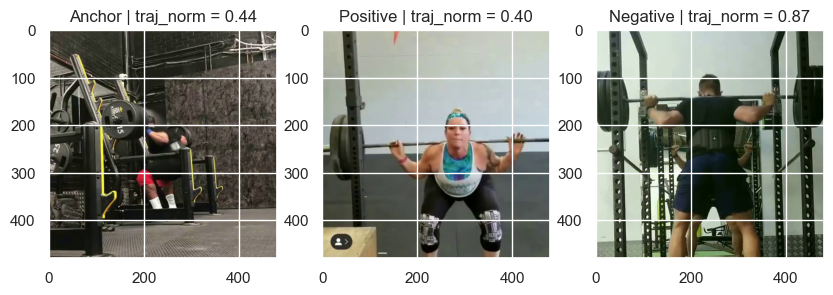

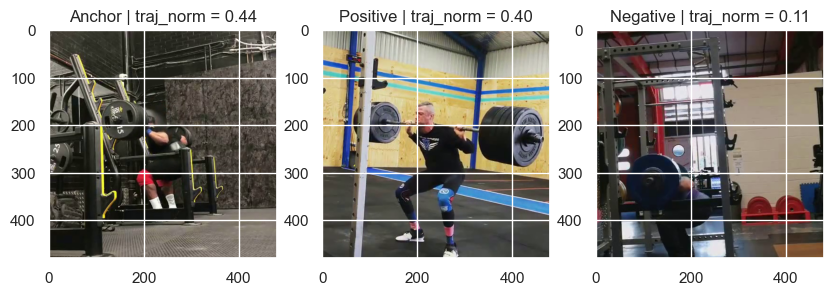

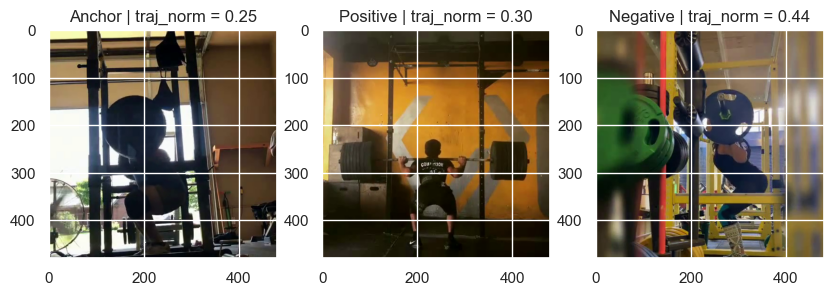

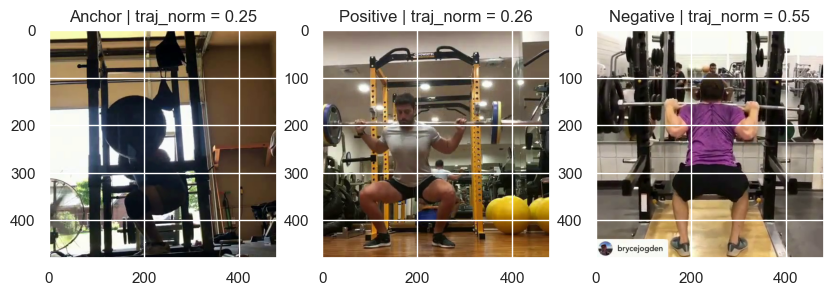

IndexError: list index out of range

In [31]:
image_size = (480, 480)

for i in range(5):  # loop over first 10 triplets
    example = triplets[i]
    anc_idx, pos_idx, neg_idx = example[0], example[1], example[2]

    # Load anchor example video
    anchor_path = str(df_unlabeled_exploded.loc[anc_idx, "path"])
    anchor_video = iomod.load_video(anchor_path, image_size=image_size)

    # Load positive example video
    positive_path = str(df_unlabeled_exploded.loc[pos_idx, "path"])
    positive_video = iomod.load_video(positive_path, image_size=image_size)

    # Load negative example video
    negative_path = str(df_unlabeled_exploded.loc[neg_idx, "path"])
    negative_video = iomod.load_video(negative_path, image_size=image_size)

    # Show the anchor, positive, and negative example videos
    fig, ax = plt.subplots(1, 3, figsize=(10, 5))
    ax[0].imshow(anchor_video[anc_idx[1]])
    traj_norm = df_unlabeled_exploded.loc[anc_idx, "traj_norm"]
    ax[0].set_title(f"Anchor | traj_norm = {traj_norm:.2f}")
    ax[1].imshow(positive_video[pos_idx[1]])
    traj_norm = df_unlabeled_exploded.loc[pos_idx, "traj_norm"]
    ax[1].set_title(f"Positive | traj_norm = {traj_norm:.2f}")
    ax[2].imshow(negative_video[neg_idx[1]])
    traj_norm = df_unlabeled_exploded.loc[neg_idx, "traj_norm"]
    ax[2].set_title(f"Negative | traj_norm = {traj_norm:.2f}")
    plt.show()

# contrastive learning template

In [50]:
def flip_random_crop(image):
    # With random crops we also apply horizontal flipping.
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_crop(image, (CROP_TO, CROP_TO, 3))
    return image


def color_jitter(x, strength=[0.4, 0.4, 0.4, 0.1]):
    x = tf.image.random_brightness(x, max_delta=0.8 * strength[0])
    x = tf.image.random_contrast(
        x, lower=1 - 0.8 * strength[1], upper=1 + 0.8 * strength[1]
    )
    x = tf.image.random_saturation(
        x, lower=1 - 0.8 * strength[2], upper=1 + 0.8 * strength[2]
    )
    x = tf.image.random_hue(x, max_delta=0.2 * strength[3])
    # Affine transformations can disturb the natural range of
    # RGB images, hence this is needed.
    x = tf.clip_by_value(x, 0, 255)
    return x


def color_drop(x):
    x = tf.image.rgb_to_grayscale(x)
    x = tf.tile(x, [1, 1, 3])
    return x


def random_apply(func, x, p):
    if tf.random.uniform([], minval=0, maxval=1) < p:
        return func(x)
    else:
        return x


def custom_augment(image):
    # As discussed in the SimCLR paper, the series of augmentation
    # transformations (except for random crops) need to be applied
    # randomly to impose translational invariance.
    image = flip_random_crop(image)
    image = random_apply(color_jitter, image, p=0.8)
    image = random_apply(color_drop, image, p=0.2)
    return image

In [42]:
# shared with downstream
AUTO = tf.data.AUTOTUNE
BATCH_SIZE = 128
EPOCHS = 3
CROP_TO = 32
SEED = 26

PROJECT_DIM = 2048
LATENT_DIM = 512
WEIGHT_DECAY = 0.0005

# (x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

# 36 sec to download and load the dataset

In [54]:
x_train.shape

(50000, 32, 32, 3)

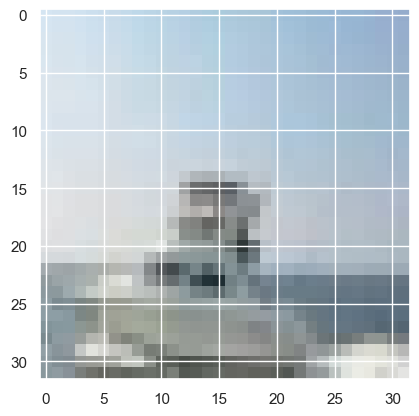

In [55]:
plt.imshow(x_train[100])

In [104]:
ssl_ds_one = tf.data.Dataset.from_tensor_slices(x_train)

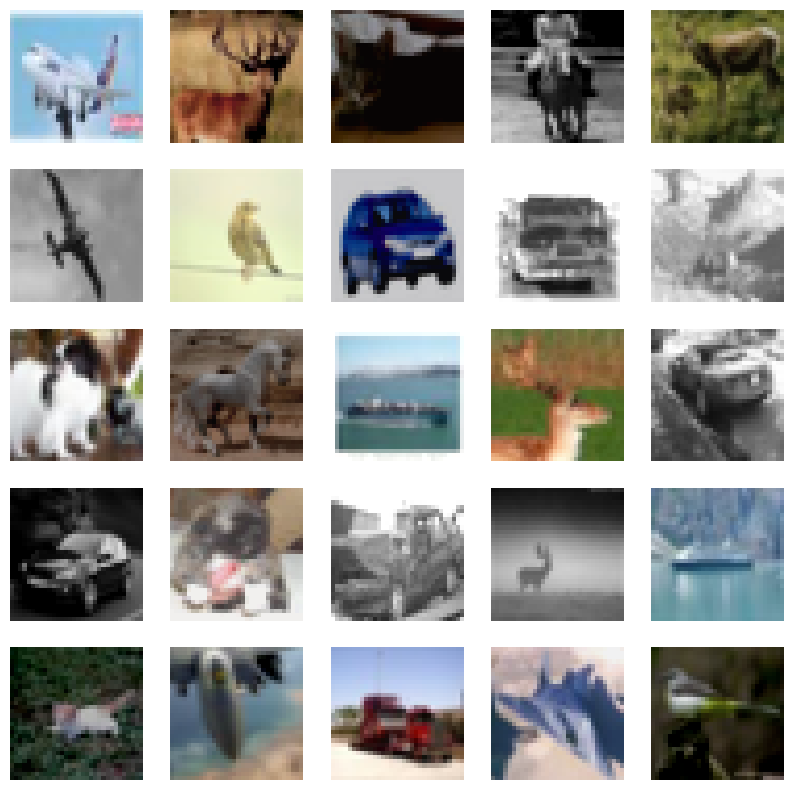

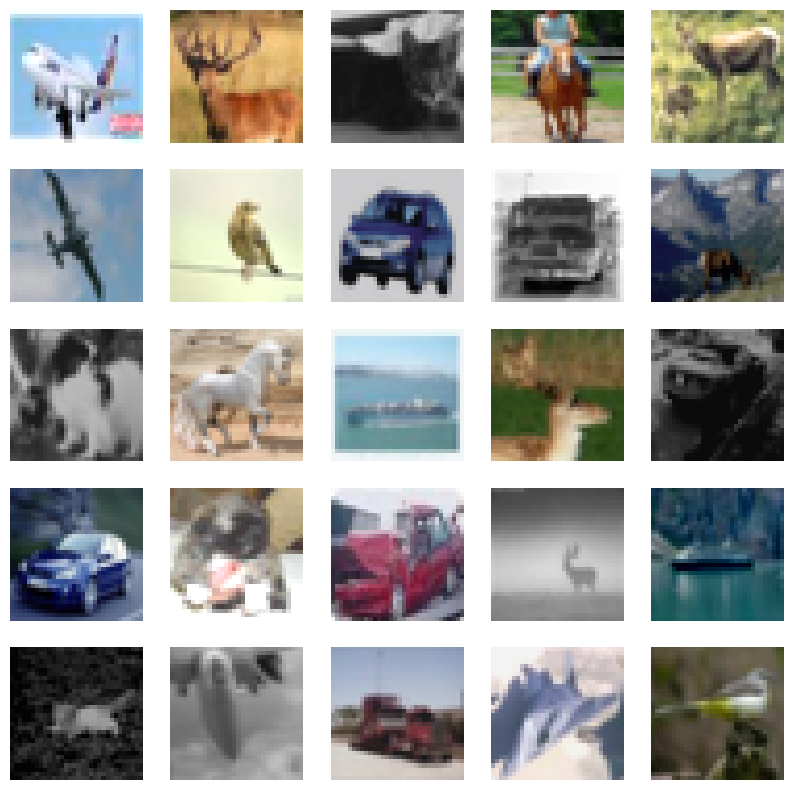

In [105]:
ssl_ds_one = tf.data.Dataset.from_tensor_slices(x_train)
ssl_ds_one = (
    ssl_ds_one.shuffle(1024, seed=SEED)
    .map(custom_augment, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

ssl_ds_two = tf.data.Dataset.from_tensor_slices(x_train)
ssl_ds_two = (
    ssl_ds_two.shuffle(1024, seed=SEED)
    .map(custom_augment, num_parallel_calls=AUTO)
    .batch(BATCH_SIZE)
    .prefetch(AUTO)
)

# We then zip both of these datasets.
ssl_ds = tf.data.Dataset.zip((ssl_ds_one, ssl_ds_two))

# Visualize a few augmented images.
sample_images_one = next(iter(ssl_ds_one))
plt.figure(figsize=(10, 10))
for n in range(25):
    ax = plt.subplot(5, 5, n + 1)
    plt.imshow(sample_images_one[n].numpy().astype("int"))
    plt.axis("off")
plt.show()

# Ensure that the different versions of the dataset actually contain
# identical images.
sample_images_two = next(iter(ssl_ds_two))
plt.figure(figsize=(10, 10))
for n in range(25):
    ax = plt.subplot(5, 5, n + 1)
    plt.imshow(sample_images_two[n].numpy().astype("int"))
    plt.axis("off")
plt.show()

In [38]:
# shared with training downstream
import resnet_cifar10_v2

N = 2
DEPTH = N * 9 + 2
NUM_BLOCKS = ((DEPTH - 2) // 9) - 1


def get_encoder():
    # Input and backbone.
    inputs = layers.Input((CROP_TO, CROP_TO, 3))
    x = layers.Rescaling(scale=1.0 / 127.5, offset=-1)(
        inputs
    )
    x = resnet_cifar10_v2.stem(x)
    x = resnet_cifar10_v2.learner(x, NUM_BLOCKS)
    x = layers.GlobalAveragePooling2D(name="backbone_pool")(x)

    # Projection head.
    x = layers.Dense(
        PROJECT_DIM, use_bias=False, kernel_regularizer=regularizers.l2(WEIGHT_DECAY)
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Dense(
        PROJECT_DIM, use_bias=False, kernel_regularizer=regularizers.l2(WEIGHT_DECAY)
    )(x)
    outputs = layers.BatchNormalization()(x)
    return tf.keras.Model(inputs, outputs, name="encoder")


def get_predictor():
    model = tf.keras.Sequential(
        [
            # Note the AutoEncoder-like structure.
            layers.Input((PROJECT_DIM,)),
            layers.Dense(
                LATENT_DIM,
                use_bias=False,
                kernel_regularizer=regularizers.l2(WEIGHT_DECAY),
            ),
            layers.ReLU(),
            layers.BatchNormalization(),
            layers.Dense(PROJECT_DIM),
        ],
        name="predictor",
    )
    return model

In [101]:
# for template model use only
def compute_loss(p, z):
    # The authors of SimSiam emphasize the impact of
    # the `stop_gradient` operator in the paper as it
    # has an important role in the overall optimization.
    z = tf.stop_gradient(z)
    p = tf.math.l2_normalize(p, axis=1)
    z = tf.math.l2_normalize(z, axis=1)
    # Negative cosine similarity (minimizing this is
    # equivalent to maximizing the similarity).
    return -tf.reduce_mean(tf.reduce_sum((p * z), axis=1))

In [102]:
class SimSiam(tf.keras.Model):
    def __init__(self, encoder, predictor):
        super().__init__()
        self.encoder = encoder
        self.predictor = predictor
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")

    @property
    def metrics(self):
        return [self.loss_tracker]

    def train_step(self, data):
        # Unpack the data.
        ds_one, ds_two = data

        # Forward pass through the encoder and predictor.
        with tf.GradientTape() as tape:
            z1, z2 = self.encoder(ds_one), self.encoder(ds_two)
            p1, p2 = self.predictor(z1), self.predictor(z2)
            # Note that here we are enforcing the network to match
            # the representations of two differently augmented batches
            # of data.
            loss = compute_loss(p1, z2) / 2 + compute_loss(p2, z1) / 2

        # Compute gradients and update the parameters.
        learnable_params = (
            self.encoder.trainable_variables + self.predictor.trainable_variables
        )
        gradients = tape.gradient(loss, learnable_params)
        self.optimizer.apply_gradients(zip(gradients, learnable_params))

        # Monitor loss.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

Epoch 1/3
391/391 [==============================] - 971s 2s/step - loss: -0.8540
Epoch 2/3
391/391 [==============================] - 896s 2s/step - loss: -0.8724
Epoch 3/3
391/391 [==============================] - 927s 2s/step - loss: -0.8735


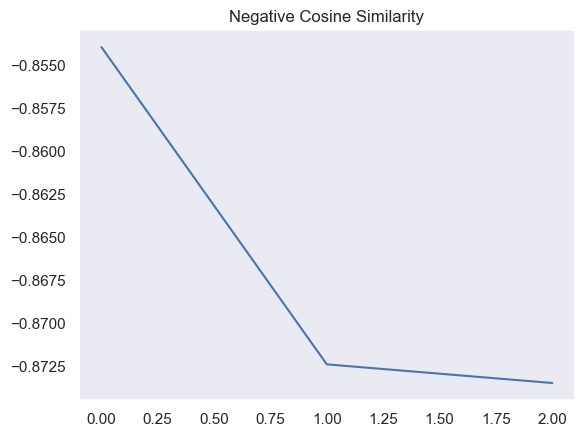

In [106]:
# Create a cosine decay learning scheduler.
num_training_samples = len(x_train)
steps = EPOCHS * (num_training_samples // BATCH_SIZE)
lr_decayed_fn = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=0.03, decay_steps=steps
)

# Create an early stopping callback.
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="loss", patience=5, restore_best_weights=True
)

# Compile model and start training.
simsiam = SimSiam(get_encoder(), get_predictor())
simsiam.compile(optimizer=tf.keras.optimizers.SGD(lr_decayed_fn, momentum=0.6))
history = simsiam.fit(ssl_ds, epochs=EPOCHS, callbacks=[early_stopping])

# Visualize the training progress of the model.
plt.plot(history.history["loss"])
plt.grid()
plt.title("Negative Cosine Similarity")
plt.show()

# test training

In [39]:
def triplet_loss(a, p, n, margin):
    a = tf.math.l2_normalize(a, axis=1)
    p = tf.math.l2_normalize(p, axis=1)
    n = tf.math.l2_normalize(n, axis=1)

    pos_sim = tf.reduce_sum(p * a, axis=1)
    neg_sim = tf.reduce_sum(p * n, axis=1)
    
    loss = tf.math.maximum(0., margin + neg_sim - pos_sim)
    return tf.reduce_mean(loss)

class TripletSiam(tf.keras.Model):
    def __init__(self, encoder, predictor, margin=0.2):
        super().__init__()
        self.encoder = encoder
        self.predictor = predictor
        self.margin = margin
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")

    @property
    def metrics(self):
        return [self.loss_tracker]

    def train_step(self, data):
        ds_anchor, ds_positive, ds_negative = data

        with tf.GradientTape() as tape:
            z_a = self.encoder(ds_anchor)
            z_p = self.encoder(ds_positive)
            z_n = self.encoder(ds_negative)

            p_a = self.predictor(z_a)
            p_p = self.predictor(z_p)
            p_n = self.predictor(z_n)

            loss = triplet_loss(z_a, z_p, z_n, self.margin)

        learnable_params = (
            self.encoder.trainable_variables + self.predictor.trainable_variables
        )
        gradients = tape.gradient(loss, learnable_params)
        self.optimizer.apply_gradients(zip(gradients, learnable_params))

        # Monitor loss.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

In [40]:
from PIL import Image

class TripletImageGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_triplets, video_dir, batch_size=32, shuffle=True):
        self.image_triplets = image_triplets
        self.video_dir = video_dir
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.image_triplets))
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_triplets) / float(self.batch_size)))

    def __getitem__(self, index):
        indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch = [self.image_triplets[k] for k in indexes]

        anchor_images, positive_images, negative_images = self.__data_generation(batch)
        return [anchor_images, positive_images, negative_images]

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, batch):
        anchor_images = []
        positive_images = []
        negative_images = []

        for triplet in batch:
            anchor, positive, negative = triplet

            anchor_frame = self.__read_video_frame(anchor)
            positive_frame = self.__read_video_frame(positive)
            negative_frame = self.__read_video_frame(negative)

            anchor_resized = np.array(Image.fromarray(anchor_frame).resize((48, 48))) # 10x reduction
            positive_resized = np.array(Image.fromarray(positive_frame).resize((48, 48)))
            negative_resized = np.array(Image.fromarray(negative_frame).resize((48, 48)))

            anchor_images.append(anchor_resized)
            positive_images.append(positive_resized)
            negative_images.append(negative_resized)

        return (
            np.array(anchor_images, dtype=np.float32),
            np.array(positive_images, dtype=np.float32),
            np.array(negative_images, dtype=np.float32),
        )

    def __read_video_frame(self, index):
        video_id, frame_id = index
        video_path = f"{self.video_dir}/{video_id}.mp4"
        reader = imageio.get_reader(video_path)

        frame = reader.get_data(frame_id)
        reader.close()

        return frame

In [45]:
encoder = get_encoder()  
predictor = get_predictor()
margin = 0.2
TS_model = TripletSiam(encoder, predictor, margin)
optimizer = Adam(learning_rate=0.0001)
TS_model.compile(optimizer)

video_directory = "data/Fitness-AQA/Fitness-AQA_dataset_release_002/Squat/Unlabeled_Dataset/videos"  # Set the path to the video directory
batch_size = 32
shuffle = True
train_generator = TripletImageGenerator(triplets, video_directory, batch_size, shuffle)

epochs = 1
TS_model.fit(train_generator, epochs=epochs)

# approx 3-5 min per epoch 

1/1 [==============================] - 10s 10s/step - loss: 0.2510


In [103]:
# load weights
TS_model.load_weights(r'models\230328_1000triplets\TS_model_weights.h5')

# test embeddings in binary classifier

In [ ]:
df_labeled[:2]

In [47]:
from typing import List, Tuple

def _get_frame_number(start_end: Tuple[float, float], fps: float = 30) -> Tuple[int, int]:
    """get frame id from start and end time in seconds"""
    start = start_end[0]
    end = start_end[1]
    if np.isnan(start) or np.isnan(end):
        return None, None
    start_frame = int(start * fps)
    end_frame = int(end * fps)
    return start_frame, end_frame

def get_labels(video_path, start_end: Tuple[float, float], fps: float = 30) -> np.ndarray:
    video = cv.VideoCapture(str(video_path))
    frame_count = int(video.get(cv.CAP_PROP_FRAME_COUNT))
    labels = np.zeros(frame_count)
    if start_end[0] is not None and start_end[1] is not None:
        start_frame, end_frame = _get_frame_number(start_end)
        labels[start_frame:end_frame] = 1
    return labels

In [48]:
# check input lengths, load each video and check dimensions for labeled (30s runtime)
for i in range(len(df_labeled)):
    try:
        video_path = df_labeled.path[i]
        video = cv.VideoCapture(str(video_path))
        fps = video.get(cv.CAP_PROP_FPS)
        frame_count = int(video.get(cv.CAP_PROP_FRAME_COUNT))
        duration = frame_count/fps
        image_width = int(video.get(cv.CAP_PROP_FRAME_WIDTH))
        image_height = int(video.get(cv.CAP_PROP_FRAME_HEIGHT))
        print(f"{video_path.stem} {duration:.2f} {frame_count} {fps:.2f} {image_width}x{image_height}")
        # load into new column
        df_labeled.loc[video_path.stem, "duration"] = duration
        df_labeled.loc[video_path.stem, "frame_count"] = frame_count
        df_labeled.loc[video_path.stem, "fps"] = fps
        df_labeled.loc[video_path.stem, "image_width"] = image_width
        df_labeled.loc[video_path.stem, "image_height"] = image_height

    except:
        print(f"{i}")

idx = df_labeled[(df_labeled.image_width == 480) & (df_labeled.image_height == 480)].index
df_labeled = df_labeled.loc[idx].reset_index(drop=False).set_index("name")

# filter for 480x480
idx = df_labeled[(df_labeled.image_width == 480) & (df_labeled.image_height == 480)].index
df_labeled = df_labeled.loc[idx].reset_index(drop=False).set_index("name")
df_labeled

32903_8 2.83 85 30.00 480x600
32907_3 4.97 149 30.00 480x600
32939_2 3.20 96 30.00 480x600
32964_1 3.80 114 30.00 480x480
32971_2 2.77 83 30.00 480x480
32975_6 2.37 71 30.00 480x480
32977_1 2.77 83 30.00 480x480
32979_1 2.87 86 30.00 480x270
32987_5 2.93 88 30.00 480x270
32990_6 3.33 100 30.00 480x480
32991_2 6.47 194 30.00 480x600
32995_3 5.77 173 30.00 480x270
32996_2 2.97 89 30.00 480x480
33006_2 5.50 165 30.00 480x480
33010_3 2.23 67 30.00 480x600
33018_1 2.80 84 30.00 480x600
33024_2 3.17 95 30.00 480x600
33028_2 3.40 102 30.00 480x600
33029_1 3.40 102 30.00 480x480
33031_2 2.20 66 30.00 480x600
33035_4 2.37 71 30.00 480x480
33036_2 2.67 80 30.00 480x480
33044_11 3.53 106 30.00 480x594
33045_1 2.73 82 30.00 480x600
33048_1 4.17 125 30.00 480x480
33051_1 5.70 171 30.00 720x900
33052_1 5.07 152 30.00 480x480
33053_1 6.07 182 30.00 480x480
33058_3 3.27 98 30.00 480x480
33063_6 4.30 129 30.00 480x480
33071_1 2.47 74 30.00 480x600
33072_1 4.07 122 30.00 480x600
33073_2 3.77 113 30.00 4

,path,errorlabels_inward_start,errorlabels_inward_end,errorlabels_forward_start,errorlabels_forward_end,barbell_trajectory,duration,frame_count,fps,image_width,image_height
name,,,,,,,,,,,
32964_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,1.15,2.51,"[389.5, 389.0, 389.0, 388.5, 388.0, 381.0, 381...",3.800000,114.0,30.0,480.0,480.0
32971_2,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,0.62,2.56,"[295.5, 293.5, 291.5, 291.0, 285.5, 283.5, 279...",2.766667,83.0,30.0,480.0,480.0
32975_6,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[366.0, 364.0, 362.5, 359.5, 357.0, 355.0, 349...",2.366667,71.0,30.0,480.0,480.0
32977_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,0.69,2.13,"[309.0, 309.0, 307.5, 305.5, 301.5, 297.5, 293...",2.766667,83.0,30.0,480.0,480.0
32990_6,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,1.39,2.35,"[338.5, 338.0, 335.0, 334.5, 334.5, 333.5, 333...",3.333333,100.0,30.0,480.0,480.0
...,...,...,...,...,...,...,...,...,...,...,...
50705_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,NaN,NaN,"[338.0, 337.0, 336.0, 333.0, 329.5, 326.5, 323...",2.766667,83.0,30.0,480.0,480.0
50709_3,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,0.58,2.18,"[278.0, 277.5, 276.5, 276.0, 275.0, 275.0, 274...",3.666667,110.0,30.0,480.0,480.0
50745_1,data\Fitness-AQA\Fitness-AQA_dataset_release_0...,NaN,NaN,0.89,3.42,"[285.0, 284.0, 282.5, 281.0, 277.0, 273.5, 270...",4.533333,136.0,30.0,480.0,480.0


In [ ]:
# df_labeled[~df_labeled.errorlabels_inward_start.isnull() & ~df_labeled.errorlabels_inward_end.isnull()]

In [399]:
# divide at video level for test set i.e. 489 videos --> divide into 389 for training and 100 for test set
# df_labeled_train = df_labeled[~df_labeled.errorlabels_forward_start.isnull() & ~df_labeled.errorlabels_forward_end.isnull()][:389]
# df_labeled_test = df_labeled[~df_labeled.errorlabels_forward_start.isnull() & ~df_labeled.errorlabels_forward_end.isnull()][389:]

In [49]:
def process_labeled(df):
    """add frame indices, apply normalize_barbell_trajectory and explode w/ binary error labels"""
    df["fri"] = df["barbell_trajectory"].apply(lambda x: list(range(len(x))))
    df['traj_norm'] = df.barbell_trajectory.apply(normalize_barbell_trajectory)
    df["labels"] = df.apply(lambda x: get_labels(x.path, (x.errorlabels_forward_start, x.errorlabels_forward_end), x.fps), axis=1)
    df_exploded = df.explode(["traj_norm", "fri", "labels"])
    df_exploded = df_exploded[df_exploded.traj_norm.notnull()].drop(columns=["barbell_trajectory"])
    df_exploded = df_exploded.reset_index(drop=False).set_index(["name", "fri"])
    df_exploded.traj_norm = df_exploded.traj_norm.astype(float)
    df_exploded.labels = df_exploded.labels.astype(int)
    df_exploded = df_exploded.drop(columns=["errorlabels_inward_start", "errorlabels_inward_end", "errorlabels_forward_start", "errorlabels_forward_end"])
    return df_exploded

In [50]:
# # divide at video level for test set
# df_labeled_train_exploded = process_labeled(df_labeled_train)
# df_labeled_test_exploded = process_labeled(df_labeled_test)
# print(f"{len(df_labeled_train_exploded), len(df_labeled_test_exploded)}")

# randomly sample for test set after processing and exploding frames
df_labeled_exploded = process_labeled(df_labeled)
df_labeled_exploded_train = df_labeled_exploded.sample(frac=0.8, random_state=42)
df_labeled_exploded_test = df_labeled_exploded.drop(df_labeled_exploded_train.index)

# Print the number of rows in each set
assert len(df_labeled_exploded) == (len(df_labeled_exploded_train) + len(df_labeled_exploded_test)), "error in dividing set"
print(f"Total set size: {len(df_labeled_exploded)}")
print(f"Train set size: {len(df_labeled_exploded_train)}")
print(f"Test set size: {len(df_labeled_exploded_test)}")

Total set size: 83538
Train set size: 66830
Test set size: 16708


In [ ]:
# reload model - incomplete

# # load weights
# # create an instance of TripletSiam model
# TS_model = TripletSiam(encoder, predictor, margin)
# optimizer = Adam(learning_rate=0.0001)
# TS_model.compile(optimizer)
# TS_model.fit(train_generator, epochs=1)

# # load weights
# TS_model.load_weights("models/triplet_siam/230316_triplet_siam_weights.h5")

In [51]:
def get_embeddings_labels(df: pd.DataFrame, model: TripletSiam, 
					   video_directory: str, resize_dim: Tuple[int, int] = (32, 32)) -> Tuple[np.ndarray, np.ndarray]:
	"""
	Extracts embeddings and labels from a dataframe of video frames.
	Args:
		df: Pandas DataFrame containing columns ["traj_norm", "labels"].
		model: TripletSiam model used to extract embeddings.
		video_directory: Directory where videos are stored.
		resize_dim: Tuple of ints representing the desired dimensions to resize frames to. Default is (32, 32).
   Returns:
		Tuple of embeddings and labels as numpy arrays.
	"""
	embeddings = []
	labels = []
	for index, row in df.iterrows():
		video_id, frame_id = index
		video_path = f"{video_directory}/{video_id}.mp4"
		reader = imageio.get_reader(video_path)
		frame = reader.get_data(frame_id)
		frame_rsz = np.expand_dims(cv.resize(frame, resize_dim), axis=0)
		embedding = model.encoder.predict(frame_rsz)
		embeddings.append(embedding.flatten())
		labels.append(row["labels"])
	embeddings = np.array(embeddings)
	labels = np.array(labels)
	return embeddings, labels


In [104]:
# embeddings_train, labels_train = get_embeddings_labels(df_labeled_train_exploded, model=TS_model, video_directory=video_directory)

# test run on 5000 first
embeddings_train, labels_train = get_embeddings_labels(df_labeled_exploded_train, model=TS_model, video_directory=video_directory)

1/1 [==============================] - 0s 19ms/step


In [105]:
len(labels_train)

66830

## test feeding embeddings into SVM, MLP-3, first to overfit on existing training data

In [65]:
%ls data\compiled

 Volume in drive C has no label.
 Volume Serial Number is BAE8-2010

 Directory of c:\MLprojects\human_motion_analysis\data\compiled

03/30/2023  10:12 PM    <DIR>          .
03/30/2023  10:12 PM    <DIR>          ..
05/30/2022  01:05 PM            24,349 dance_input.gif_out_edges.pkl
05/30/2022  01:05 PM            17,295 dance_input.gif_out_keypoints.pkl
06/06/2022  01:19 PM         6,949,408 df_edge_features_test.pkl
06/06/2022  01:22 PM        22,932,256 df_edge_features_train.pkl
06/06/2022  01:22 PM         5,420,128 df_edge_features_val.pkl
05/16/2022  02:17 PM        75,199,263 df_kpts
03/28/2023  06:39 PM        16,553,259 df_unlabeled_exploded.pkl
05/16/2022  02:17 PM        20,627,675 edge_length_all
05/16/2022  02:17 PM        19,481,728 edge_vel_all
03/29/2023  10:16 PM       488,416,422 embeddings_all_230328_1000triplets.pkl
03/30/2023  09:52 PM       685,012,003 embeddings_all_230328_600triplets_randomsample.pkl
03/30/2023  11:29 AM       684,677,851 embeddings_all_23032

## load embeddings

In [29]:
with open("data\compiled\embeddings_all_230328_1000triplets_randomsample.pkl", "rb") as f:
    embeddings_all = pkl.load(f)


embeddings_train, labels_train, embeddings_test, labels_test = embeddings_all["embeddings_train"], embeddings_all["labels_train"], \
                                                                embeddings_all["embeddings_test"], embeddings_all["labels_test"]

In [90]:
# # print shapes
# print(f"embeddings_train.shape: {embeddings_train.shape}")
# print(f"labels_train.shape: {labels_train.shape}")
# print(f"embeddings_test.shape: {embeddings_test.shape}")
# print(f"labels_test.shape: {labels_test.shape}")

embeddings_train.shape: (66830, 2048)
labels_train.shape: (66830,)
embeddings_test.shape: (16708, 2048)
labels_test.shape: (16708,)


In [54]:
!nvidia-smi

Fri Mar 31 17:57:02 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 516.94       Driver Version: 516.94       CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0  On |                  N/A |
| 38%   45C    P5    37W / 350W |  24106MiB / 24576MiB |     71%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA GeForce ... WDDM  | 00000000:21:00.0 Off |                  N/A |
| 30%   

In [55]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]

In [6]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# # SVM classifier
# svm = SVC(kernel='linear', C=1.0, random_state=42)
# svm.fit(embeddings_train, labels_train)
# svm_preds = svm.predict(embeddings_train)
# svm_report = classification_report(labels_train, svm_preds)

In [30]:
# Neural network classifier
epochs = 20

nn_model = tf.keras.Sequential([
  layers.Dense(512, activation='relu', input_shape=(embeddings_train.shape[1],)),
  layers.Dropout(0.2),
  layers.Dense(256, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(128, activation='relu'),
  layers.Dense(1, activation='sigmoid')
])

nn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
nn_model.fit(embeddings_train, labels_train, batch_size=64, epochs=epochs)
nn_probs = nn_model.predict(embeddings_train)
nn_preds = (nn_probs > 0.5).astype(int)
nn_report = classification_report(labels_train, nn_preds)

Epoch 1/20
1045/1045 [==============================] - 7s 6ms/step - loss: 0.6564 - accuracy: 0.6008
Epoch 2/20
1045/1045 [==============================] - 7s 6ms/step - loss: 0.5883 - accuracy: 0.6727
Epoch 3/20
1045/1045 [==============================] - 6s 6ms/step - loss: 0.5329 - accuracy: 0.7189
Epoch 4/20
1045/1045 [==============================] - 6s 6ms/step - loss: 0.4886 - accuracy: 0.7506
Epoch 5/20
1045/1045 [==============================] - 6s 6ms/step - loss: 0.4557 - accuracy: 0.7750
Epoch 6/20
1045/1045 [==============================] - 6s 6ms/step - loss: 0.4271 - accuracy: 0.7919
Epoch 7/20
1045/1045 [==============================] - 7s 6ms/step - loss: 0.4046 - accuracy: 0.8068
Epoch 8/20
1045/1045 [==============================] - 7s 6ms/step - loss: 0.3859 - accuracy: 0.8174
Epoch 9/20
1045/1045 [==============================] - 7s 6ms/step - loss: 0.3658 - accuracy: 0.8294
Epoch 10/20
1045/1045 [==============================] - 6s 6ms/step - loss: 0.350

In [31]:
# print("SVM Report:")
# print(svm_report)

print("Neural Network Report:")
print(nn_report)

Neural Network Report:
              precision    recall  f1-score   support

           0       0.89      0.92      0.91     28310
           1       0.94      0.92      0.93     38520

    accuracy                           0.92     66830
   macro avg       0.92      0.92      0.92     66830
weighted avg       0.92      0.92      0.92     66830



In [32]:
nn_preds[3000:4000].reshape(-1)

array([1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1,
       1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1,

In [33]:
labels_train[3000:4000]

array([1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1,

## test trained model on heldout set

In [110]:
# embeddings_test, labels_test = get_embeddings_labels(df_labeled_test_exploded[:3000], model=TS_model, video_directory=video_directory)

# test on randomly sampled
embeddings_test, labels_test = get_embeddings_labels(df_labeled_exploded_test, model=TS_model, video_directory=video_directory)

1/1 [==============================] - 0s 15ms/step


In [34]:
# svm_preds = svm.predict(embeddings_test)
# svm_report = classification_report(labels_test, svm_preds)

nn_probs = nn_model.predict(embeddings_test)
nn_preds = (nn_probs > 0.5).astype(int)
nn_report = classification_report(labels_test, nn_preds)

523/523 [==============================] - 1s 1ms/step


In [35]:
# print("SVM Report:")
# print(svm_report)

print("Neural Network Report:")
print(nn_report)

Neural Network Report:
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      7059
           1       0.92      0.90      0.91      9649

    accuracy                           0.89     16708
   macro avg       0.89      0.89      0.89     16708
weighted avg       0.89      0.89      0.89     16708



In [36]:
# svm_preds

In [37]:
nn_preds[1000:2000].reshape(-1)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,

In [38]:
labels_test[1000:2000]

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,

In [82]:
labels

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [84]:
predictions.reshape(-1)

array([0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

In [107]:
df_labeled_exploded_train

NameError: name 'df_labeled_exploded_train' is not defined

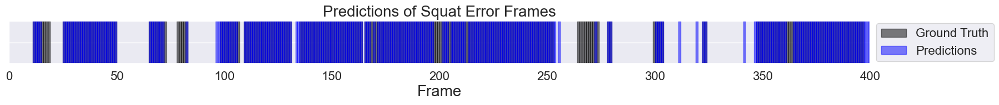

In [112]:
# refactor

labels = labels_test[600:1000]
predictions = nn_preds[600:1000]

class RasterPlot:
	def __init__(self, labels, predictions):
		self.labels = labels
		self.predictions = predictions

	def plot(self):
		patches_labels = [plt.Rectangle((i, 0), 1, 1, color='black', alpha=0.5) for i, l in enumerate(self.labels) if l]
		patches_labels += [plt.Rectangle((i, 0), 1, 1, color='blue', alpha=0.5) for i, l in enumerate(self.predictions) if l]
		fig, ax = plt.subplots(figsize=(20, 1))
		for patch in patches_labels:
			ax.add_patch(patch)
		ax.set_xlim([0, len(labels)])
		ax.set_ylim([0, 1])
		ax.spines['left'].set_visible(False)
		ax.set_yticklabels([])
		ax.set_xlabel('Frame', fontsize=20)
		ax.set_title("Predictions of Squat Error Frames", fontsize=20)
		ax.tick_params(axis='x', labelsize=16)
		legend_patches = [plt.Rectangle((0, 0), 1, 1, color='black', alpha=0.5), plt.Rectangle((0, 0), 1, 1, color='blue', alpha=0.5)]
		legend_labels = ['Ground Truth', 'Predictions']
		ax.legend(handles=legend_patches, labels=legend_labels, loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=16)
		plt.show()

rp = RasterPlot(labels, predictions)
rp.plot()

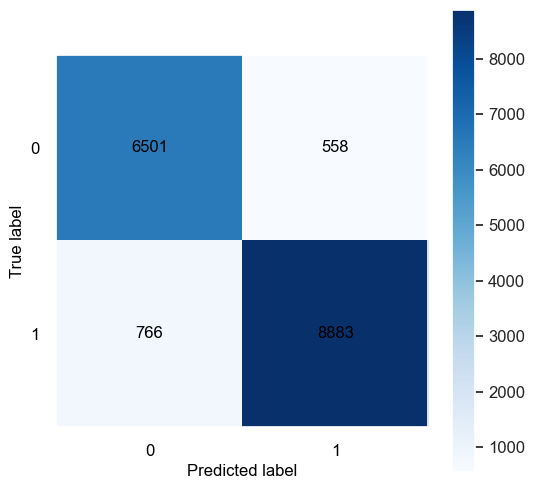

In [156]:
from sklearn.metrics import confusion_matrix
num_classes = 2
num_frames = len(labels_test)

cm = confusion_matrix(labels_test, nn_preds)

# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(cm, cmap='Blues')

# Set the tick labels and limits
ax.set_xticks(np.arange(num_classes))
ax.set_xticklabels(np.arange(num_classes), color='black')
ax.set_yticks(np.arange(num_classes))
ax.set_yticklabels(np.arange(num_classes), color='black')

# Set the remote ticks
ax.tick_params(axis='both', which='both', length=0, width=0, labelsize=0, pad=10)
ax.tick_params(axis='x', which='both', length=5, width=1, labelsize=12, pad=7, color='black')
ax.tick_params(axis='y', which='both', length=5, width=1, labelsize=12, pad=7, color='black')

# Set the axis labels
ax.set_xlabel('Predicted label', color='black', fontsize=12)
ax.set_ylabel('True label', color='black', fontsize=12)

# Add the text labels to the plot
for i in range(num_classes):
    for j in range(num_classes):
        text = ax.text(j, i, cm[i, j], ha='center', va='center', color='black', fontsize=12)

# Add the colorbar
cbar = ax.figure.colorbar(im, ax=ax)
cbar.ax.tick_params(labelsize=12)

ax.grid(False)
plt.show()

In [119]:
# # save weights
# TS_model.save_weights("models/TS_model_weights_230328_600triplets.h5")

embeddings_all = {
	"embeddings_train": embeddings_train, "labels_train": labels_train,
	"embeddings_test": embeddings_test, "labels_test": labels_test}

with open("data/compiled/embeddings_all_230328_1000triplets_randomsample.pkl", "wb") as f:
	pkl.dump(embeddings_all, f)